In [4]:
# импорт библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

%load_ext autoreload
%autoreload 2

In [5]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Часть 1. Загрузка и предоработка данных.

Зададим аргументы для чтения данных из Excel

In [6]:
sheet_names = ['sectors daily', 'sectors monthly',
               'dm daily', 'dm monthly', 
               'em daily', 'em monthly',
               'dm+em daily', 'dm+em monthly']

# сгенерируем по словарику для каждого листа в экселе
excel_kwargs = {sheet_name:
                    {'io':'data/indexes_usd_UPD.xlsx',
                    'sheet_name': sheet_name,
                    'index_col':0,
                    'usecols':list(range(21)),
                    'parse_dates':True,
                    'date_parser':lambda x:pd.to_datetime(x, format='%d.%m.%Y')}
                for sheet_name in sheet_names}

Прочитаем данные

In [7]:
sector_d = pd.read_excel(**excel_kwargs['sectors daily'])
sector_m = pd.read_excel(**excel_kwargs['sectors monthly'])
dm_d= pd.read_excel(**excel_kwargs['dm daily'])
dm_m = pd.read_excel(**excel_kwargs['dm monthly'])
em_d = pd.read_excel(**excel_kwargs['em daily'])
em_m = pd.read_excel(**excel_kwargs['em monthly'])
dm_em_d = pd.read_excel(**excel_kwargs['dm+em daily'])
dm_em_m = pd.read_excel(**excel_kwargs['dm+em monthly'])

Отдельно загрузим безрисковую ставку 

In [8]:
rf_kwargs = excel_kwargs['sectors daily']
rf_kwargs['io'] = 'data/rf_rate.xlsx'
rf_kwargs['sheet_name'] = 'daily'
rf_kwargs['usecols'] = [0,1]
rf_d = pd.read_excel(**rf_kwargs)
# теперь считаем месячные данные
rf_kwargs['sheet_name'] = 'monthly'
rf_m = pd.read_excel(**rf_kwargs)
# отсортируем от старых дат к новым
rf_d.sort_index(inplace=True)
rf_m.sort_index(inplace=True)
# заполним пропуски
rf_d.fillna(method='ffill', inplace=True)
rf_m.fillna(method='ffill', inplace=True)
# приведем проценты к сотым
rf_d = rf_d / 100
rf_m = rf_m / 100

Поменяем заголовки у столбцов, с текущими названиями будет очень неудобно работать.

In [22]:
df_list = [sector_d, sector_m, dm_d, dm_m, em_d, em_m, dm_em_d, dm_em_m]
for df in df_list:
    df.columns = [x.lower().replace(' ', '_') for x in df.columns]
    # и еще поменяем название у индексов
    df.index.name = 'date'

Предварительный анализ данных: графики, корреляции, описательные статистики. Будем сразу работать с доходностями.

Text(0.5, 1.02, 'Sector monthly returns distribution')

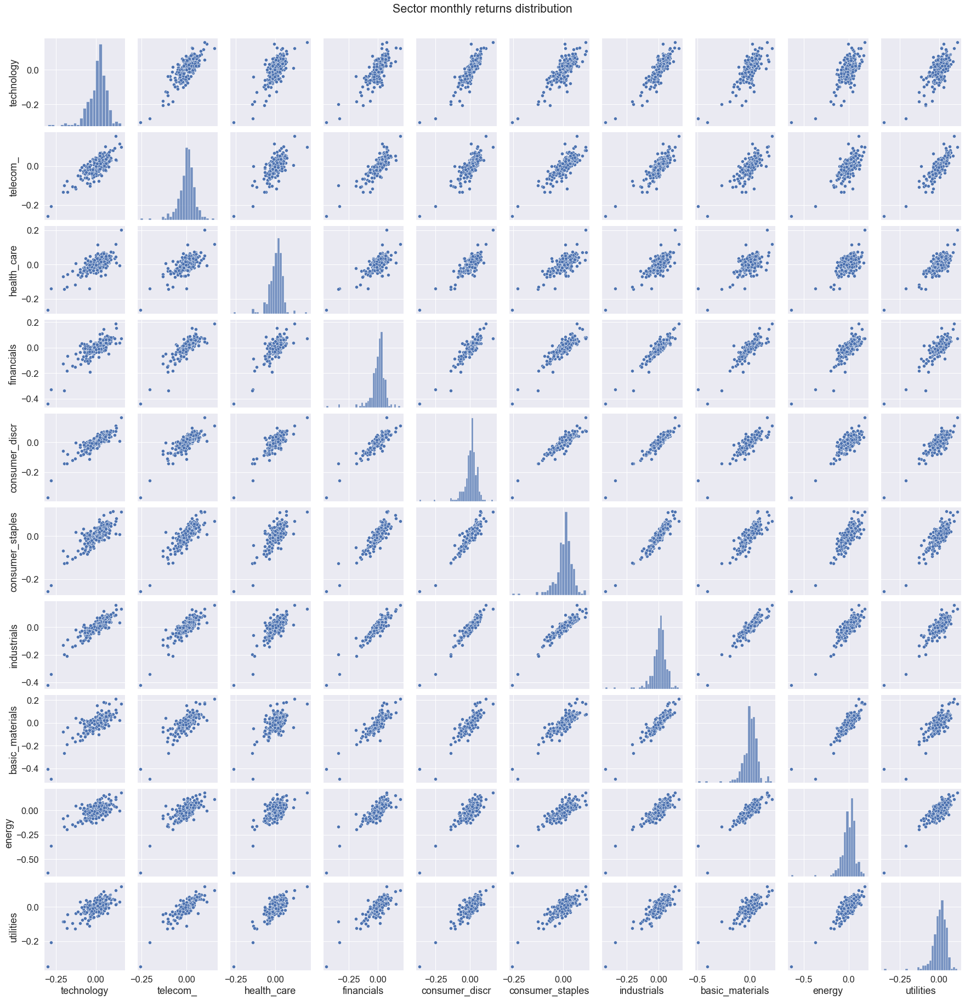

Text(0.5, 1.02, 'Sector daily returns distribution')

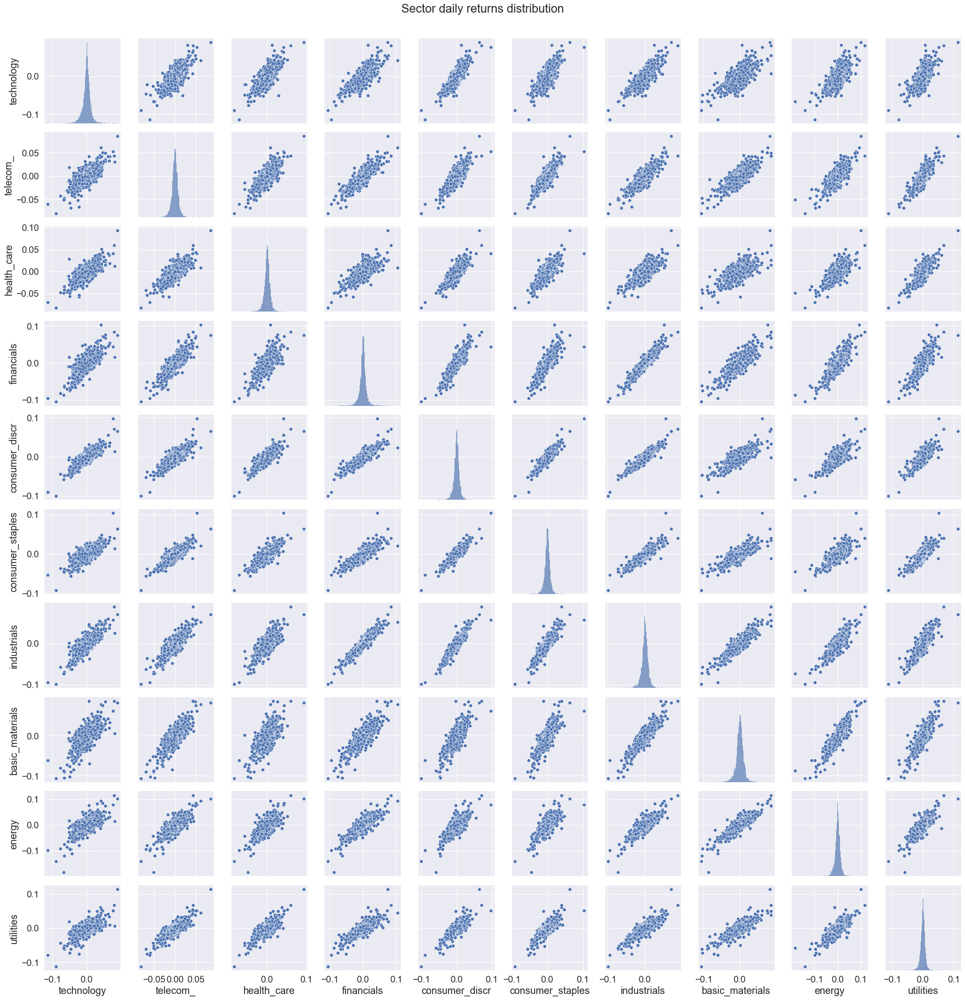

Text(0.5, 1.02, 'Emerging markets monthly returns distribuion')

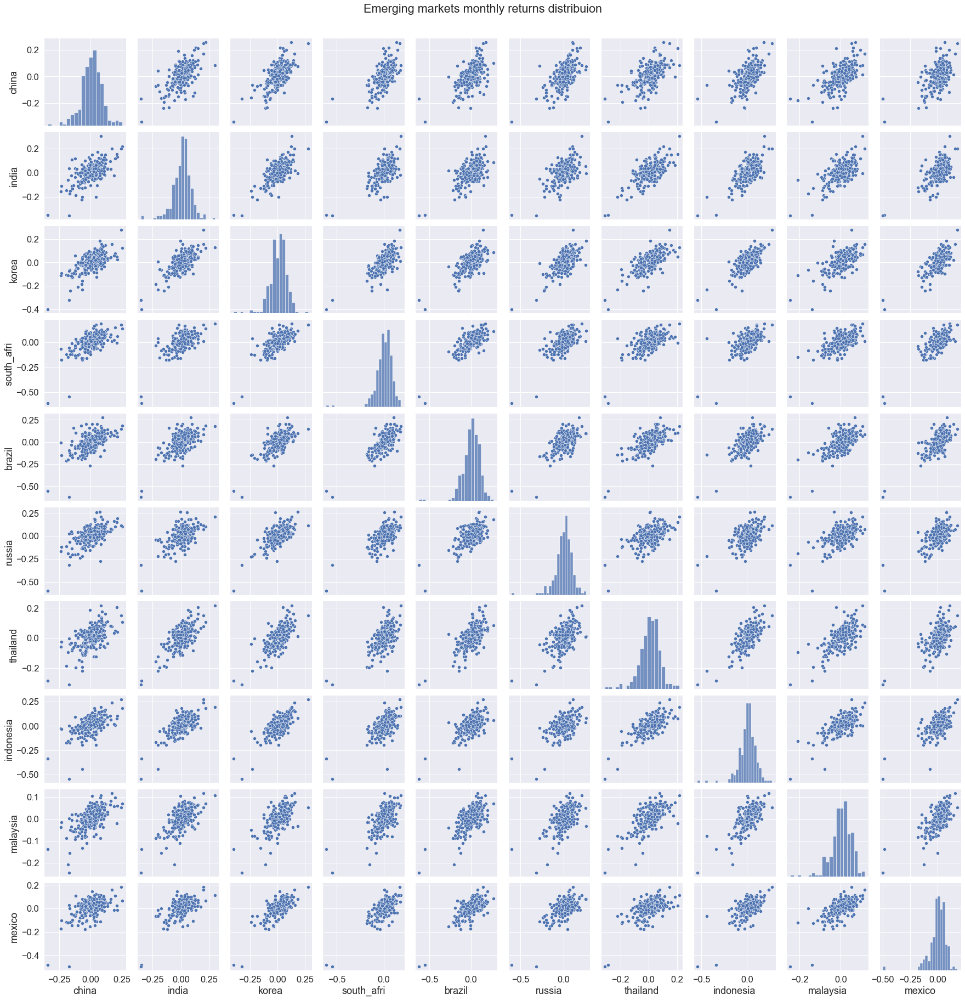

Text(0.5, 1.02, 'Emerging markets daily returns distribuion')

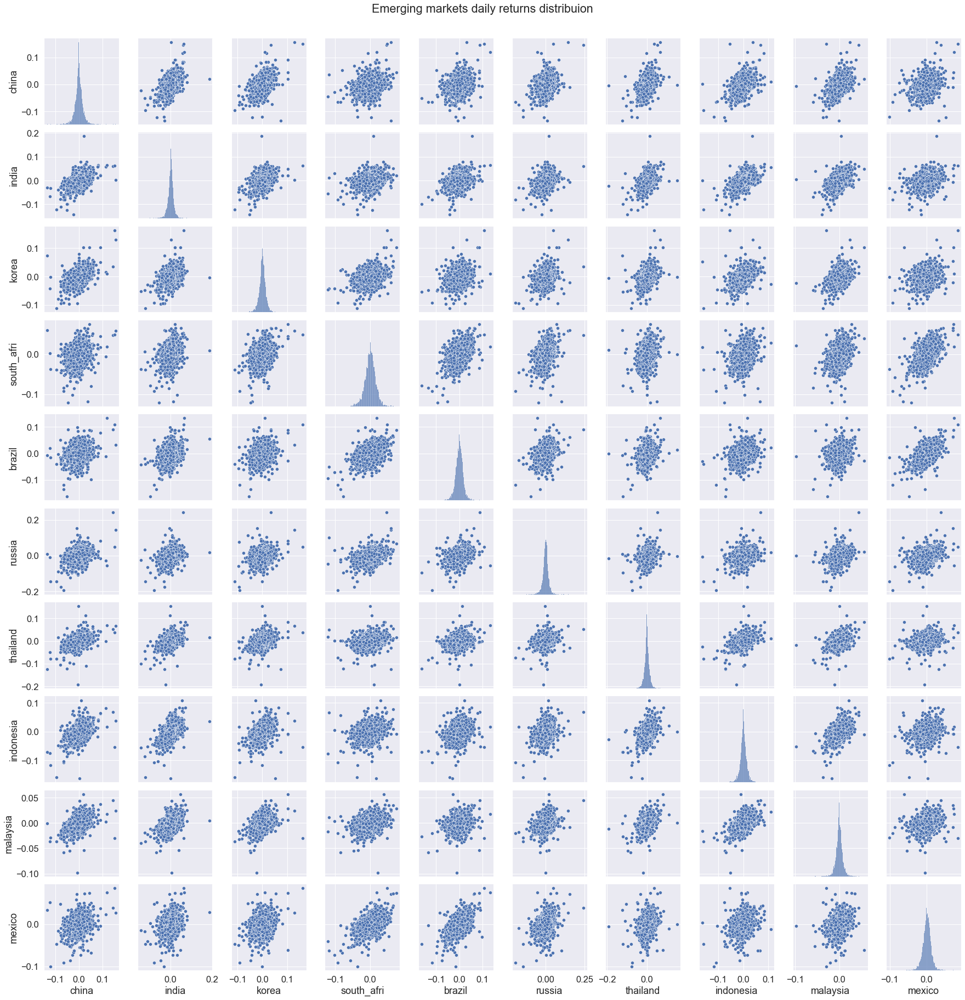

Text(0.5, 1.02, 'Developed markets monthly returns distribuion')

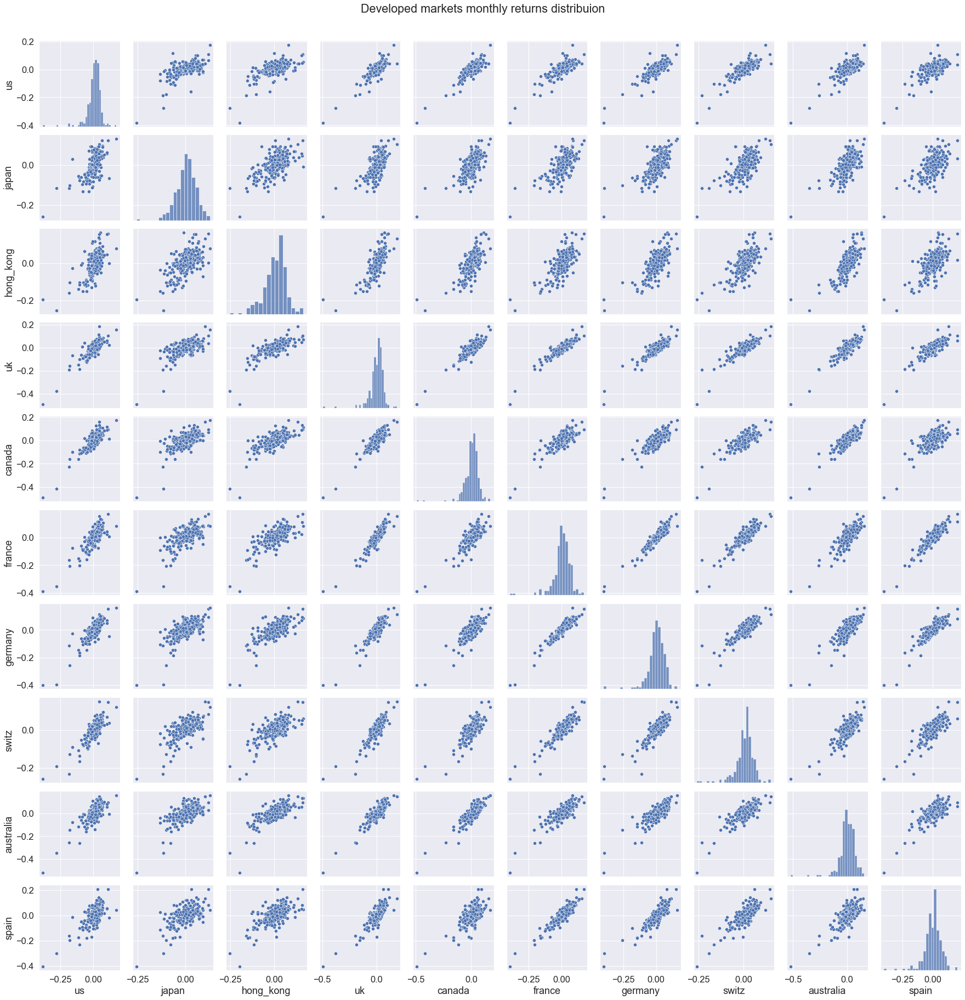

Text(0.5, 1.02, 'Developed markets daily returns distribuion')

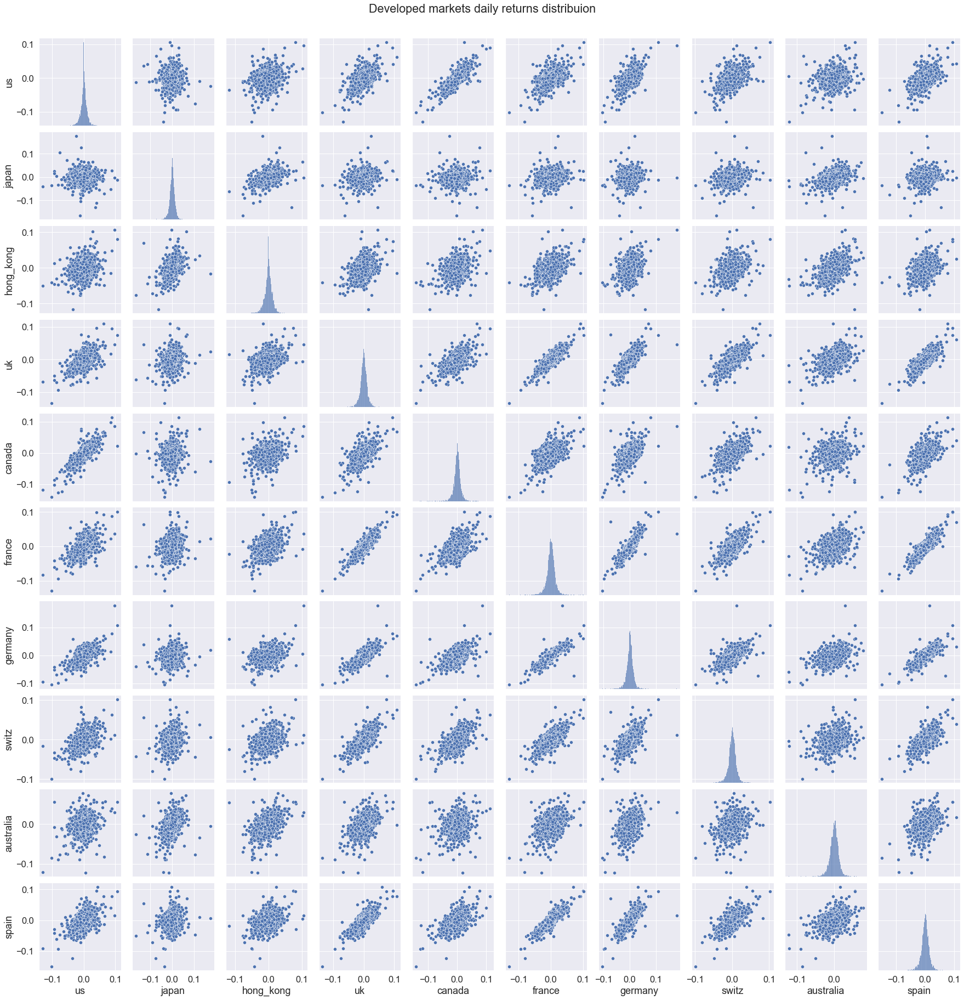

In [16]:
# создадим таблички с логарифмическими доходностями
# для данных по секторам
s_m_rets = np.log(sector_m.pct_change() + 1).iloc[1:]
s_d_rets = np.log(sector_d.pct_change() + 1).iloc[1:]
# по странам
em_m_rets = np.log(em_m.pct_change() + 1).iloc[1:]
em_d_rets = np.log(em_d.pct_change() + 1).iloc[1:]
dm_m_rets = np.log(dm_m.pct_change() + 1).iloc[1:]
dm_d_rets = np.log(dm_d.pct_change() + 1).iloc[1:]
# общая для стран
dm_em_d_rets = np.log(dm_em_d.pct_change() + 1).iloc[1:]
dm_em_m_rets = np.log(dm_em_m.pct_change() + 1).iloc[1:]

title_list = ['Sector monthly returns distribution', 
              'Sector daily returns distribution',
              'Emerging markets monthly returns distribuion',
              'Emerging markets daily returns distribuion',
              'Developed markets monthly returns distribuion',
              'Developed markets daily returns distribuion']

plot_dict = dict(zip(title_list, 
                    [s_m_rets, s_d_rets, em_m_rets, 
                     em_d_rets, dm_m_rets, dm_d_rets]))

sns.set(font_scale=1.5)
for title, data in plot_dict.items():
    g = sns.pairplot(data)
    g.fig.suptitle(title, y=1.02)
    plt.show();

Мы видим, что:
1. Распределение цен не-гауссово, с острыми пиками и выбросами.
2. Корреляция внутри стран и секторов достаточно сильная. 
  * Корреляция между секторами сильнее, чем между странами. 
  * Корреляция между развитыми странами сильнее, чем между развивающимися.
 
 Это значит, что портфель из развивающихся стран позволяет лучше диверсифицировать риски, но не факт, что он будет лучшим по доходности.

Матрицы корреляции по секторам и странам:

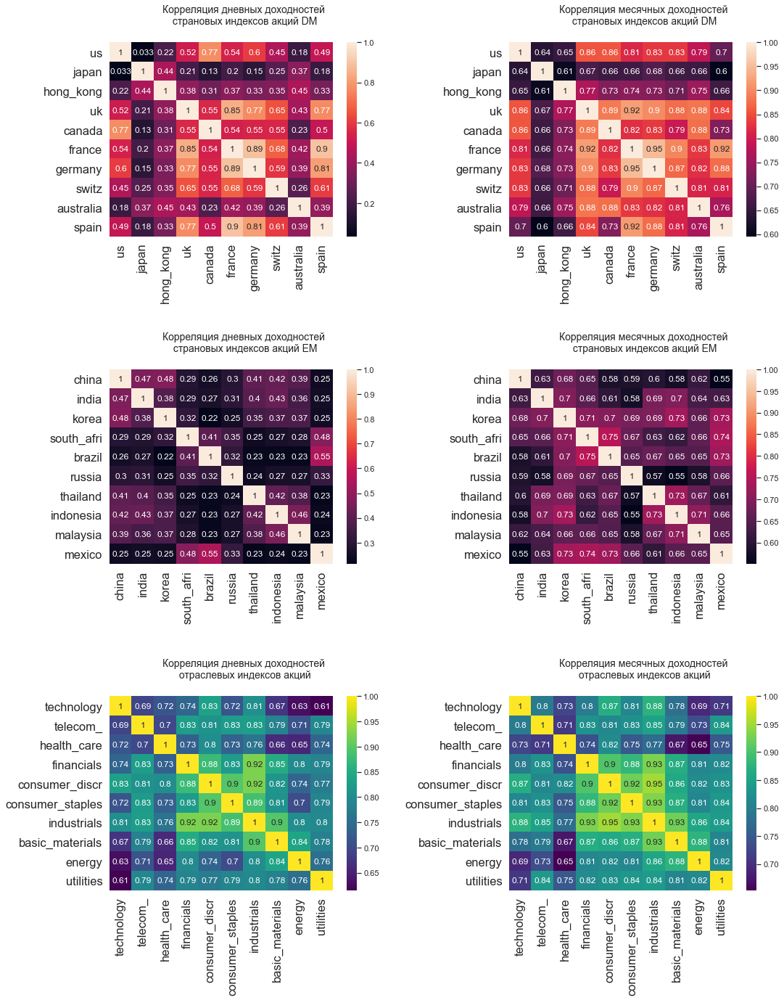

In [17]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(16, 20))

sns.set(font_scale=1)
font = {'family':'normal',
            #'weight' : 'bold',
            'size': 14}

sns.heatmap(dm_d_rets.corr(), annot=True, ax=ax[0,0])
ax[0,0].set_title('Корреляция дневных доходностей\n страновых индексов акций DM', 
                x=0.6, y=1.07, fontsize=14);
sns.heatmap(dm_m_rets.corr(), annot=True, ax=ax[0,1])
ax[0,1].set_title('Корреляция месячных доходностей\n страновых индексов акций DM', 
                x=0.6, y=1.07, fontsize=14);

sns.heatmap(em_d_rets.corr(), annot=True, ax=ax[1,0])
ax[1,0].set_title('Корреляция дневных доходностей\n страновых индексов акций EM', 
                x=0.6, y=1.07, fontsize=14);
sns.heatmap(em_m_rets.corr(), annot=True, ax=ax[1,1])
ax[1,1].set_title('Корреляция месячных доходностей\n страновых индексов акций EM', 
                x=0.6, y=1.07, fontsize=14);

sns.heatmap(s_d_rets.corr(), annot=True, ax=ax[2,0], cmap='viridis')
ax[2,0].set_title('Корреляция дневных доходностей\n отраслевых индексов акций', 
                x=0.6, y=1.07, fontsize=14);
sns.heatmap(s_m_rets.corr(), annot=True, ax=ax[2,1], cmap='viridis')
ax[2,1].set_title('Корреляция месячных доходностей\n отраслевых индексов акций', 
                x=0.6, y=1.07, fontsize=14);

fig.tight_layout(pad=3.0);

Сразу заметно, что наименее коррелированы между собой индексы развивающихся стран, а самые взаимосвязанные - индексы на сектора.

Отразим динамику кумулятивной доходности по странам и по отраслям:

In [23]:
em_d_cumrets = (em_d_rets + 1).cumprod() - 1
dm_d_cumrets = (dm_d_rets + 1).cumprod() - 1

em_m_cumrets = (em_m_rets + 1).cumprod() - 1
dm_m_cumrets = (dm_m_rets + 1).cumprod() - 1

s_d_cumrets = (s_d_rets + 1).cumprod() - 1
s_m_cumrets = (s_m_rets + 1).cumprod() - 1

dm_em_d_cumrets = (dm_em_d_rets + 1).cumprod() - 1
dm_em_m_cumrets = (dm_em_m_rets + 1).cumprod() - 1

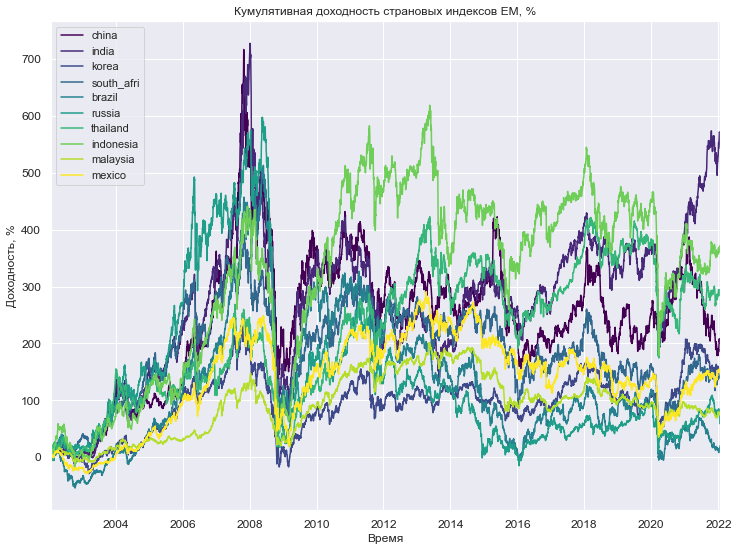

In [24]:
(em_d_cumrets*100).plot(figsize=(12, 9),
                     title='Кумулятивная доходность страновых индексов EM, %',
                     xlabel='Время', ylabel='Доходность, %',
                     cmap='viridis', fontsize=12);

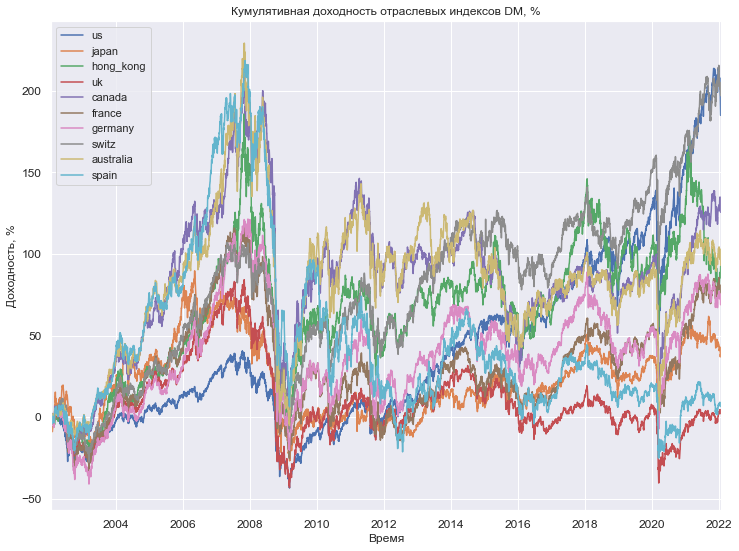

In [25]:
(dm_d_cumrets*100).plot(figsize=(12, 9),
                     title='Кумулятивная доходность отраслевых индексов DM, %',
                     xlabel='Время', ylabel='Доходность, %',
                     fontsize=12);

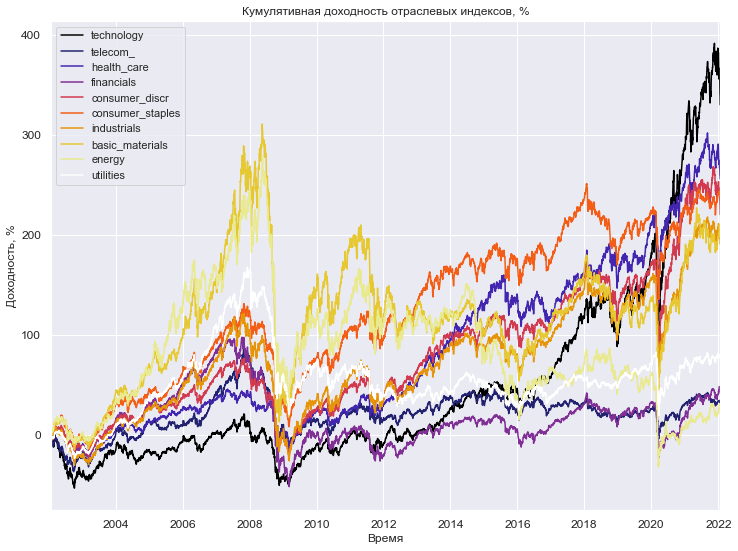

In [26]:
(s_d_cumrets*100).plot(figsize=(12, 9),
                     title='Кумулятивная доходность отраслевых индексов, %',
                     xlabel='Время', ylabel='Доходность, %',
                     cmap='CMRmap', fontsize=12);

Страновой индекс самый сильный в Соединенных Штатах (среднегодовая доходность около 5.6%), а самый доходный сектор - технологический, благодаря пандемии (среднегодовая доходность около 6%).

Распределение индексов в координатах "риск-доходность":

In [33]:
risk_return = pd.DataFrame({'returns':(em_d_rets.mean()+1)**250-1,
                            'risk':em_d_rets.std()*np.sqrt(250)})

risk_return = pd.concat([risk_return, 
                         pd.DataFrame({'returns':(dm_d_rets.mean()+1)**250-1,
                                       'risk':dm_d_rets.std()*np.sqrt(250)})], 
                         axis=0)

risk_return = pd.concat([risk_return, 
                         pd.DataFrame({'returns':(s_d_rets.mean()+1)**250-1,
                                       'risk':s_d_rets.std()*np.sqrt(250)})], 
                         axis=0)

#risk_return = pd.concat([risk_return, 
#                         pd.DataFrame({'returns':(dm_em_d_rets.mean()+1)**250-1,
#                                      'risk':dm_em_d_rets.std()*np.sqrt(250)})], 
#                         axis=0)

risk_return['group'] = ['Emerging market' for _ in em_d.columns]+\
                       ['Developed market' for _ in dm_d.columns]+\
                        ['Industry' for _ in sector_d.columns]

In [34]:
risk_return[['returns', 'risk']] = risk_return[['returns', 'risk']] * 100

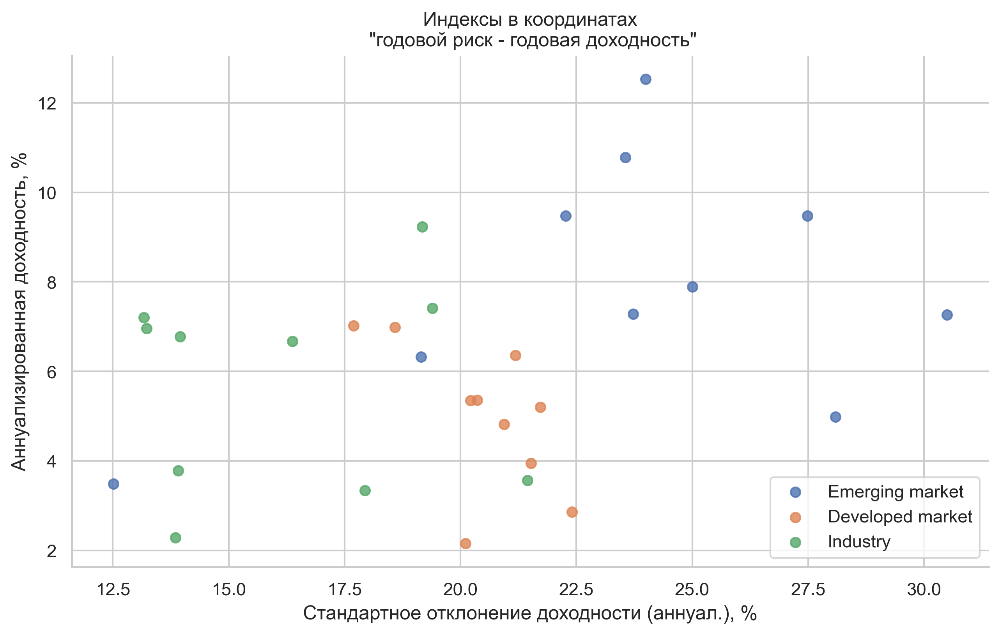

In [35]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
sns.set_style('whitegrid', {'font_scale':0.5})
#sns.set(font_scale=1)

sns.lmplot( x="risk", y="returns" , data=risk_return, 
           fit_reg=False, hue='group', height=5, aspect=1.7, legend=False)
 
plt.legend(loc='lower right')
plt.title('Индексы в координатах\n "годовой риск - годовая доходность"')
plt.xlabel('Стандартное отклонение доходности (аннуал.), %')
plt.ylabel('Аннуализированная доходность, %')
plt.show();

Видно, что самые рискованные и доходные развивающиеся рынки, а оптимальное сочетание с точки зрения "риск-доходность" предлагают отраслевые индексы.

## Часть 2. Тестирование отдельных стратегий.

Теперь протестируем сами стратегии. Для этого импортируем из модуля backtesting.py в папке code класс BackTest, который умеет тестировать стратегии на исторических данных.

In [36]:
%cd code/

/Users/nikitamuzafarov/Desktop/Github/asset-allocation/code


In [37]:
from backtesting import BackTest

In [38]:
help(BackTest)

Help on class BackTest in module backtesting:

class BackTest(builtins.object)
 |  BackTest(prices: pandas.core.frame.DataFrame = None, log_returns: bool = True)
 |  
 |  Methods defined here:
 |  
 |  __init__(self, prices: pandas.core.frame.DataFrame = None, log_returns: bool = True)
 |      Class for backtesting of strategy
 |      Parameters:
 |      -----------
 |      prices: pandas DataFrame of asset prices. Column names are
 |          string tickers, index is pandas DateTimeIndex dates. No NaNs in data
 |          are allowed.
 |      log_returns:bool, default True. Whether to compute log returns or simple
 |          arithmetic returns.
 |  
 |  factor_regression(self, factor_returns: Union[pandas.core.series.Series, pandas.core.frame.DataFrame], factors_to_drop: Union[str, list] = 'cma', alpha_only: bool = True)
 |      For documentation see factor_regression function in
 |      performance_metrics module.
 |  
 |  get_optimal_weights(self, subset)
 |      Different asset al

#### Прогоним стратегии при отраслевой диверсификации и ежемесячной ребалансировке портфеля

In [39]:
# создадим экземпляр класса
EqualWeighted = BackTest(prices=sector_d)
# прогоним стратегию
EqualWeighted.run(strategy='equal', start=252, step=21)

У класса BackTest есть отдельный метод - get_performance, который возвращает набор метрик эффективности стратегии. Посмотрим на результативность стратегии

In [40]:
EqualWeighted.get_performance(periods_in_year=252, rf=rf_d)

{'cumulative return': 1.9640081271888885,
 'annualized return': 0.06561311295451526,
 'annualized vol': 0.14437392675770636,
 'sharpe': 0.31177317969295554,
 'omega': 1.0629661068585445,
 'max drawdown': -0.5944910035272275,
 'turnover': 0,
 'cer': 0.04420085210686153,
 'sortino': 0.3639597660931724,
 'calmar': 0.07837471306908489,
 'alpha': None,
 'alpha_pvalue': None}

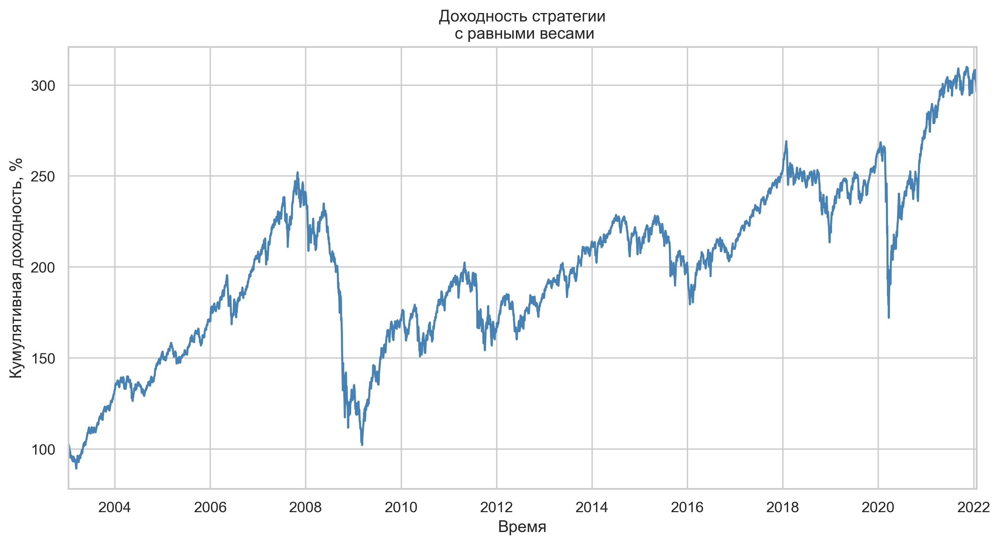

In [41]:
#Динамика кумулятивной доходности стратегии EqualWeighted
cumrets = (EqualWeighted.strategy_returns + 1).cumprod() * 100
cumrets.plot(title='Доходность стратегии\n c равными весами',
             figsize=(12, 6),
             color='steelblue',
             ylabel='Кумулятивная доходность, %',
             xlabel='Время');

Теперь прогоним стратегию с оптимизацией по Марковицу и по методам Pisk-Parity и Hierarchical Risk Parity.

In [42]:
# MV без коротких позиций
Markowitz = BackTest(prices=sector_d)
Markowitz.run(strategy='min-variance', start=252, step=21)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.8127695306482572,
 'annualized return': 0.059314664300466884,
 'annualized vol': 0.11678544326779504,
 'sharpe': 0.3516095801820066,
 'omega': 1.0667912785995004,
 'max drawdown': -0.46021296688037205,
 'turnover': 0.1632,
 'cer': 0.040689284080236185,
 'sortino': 0.42167075776157104,
 'calmar': 0.09222129314112634,
 'alpha': None,
 'alpha_pvalue': None}

In [43]:
# MV с короткими позициями
Markowitz = BackTest(prices=sector_d)
Markowitz.run(strategy='min-variance', start=252, step=21, short=True)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 2.68587293186219,
 'annualized return': 0.07200458249640931,
 'annualized vol': 0.10778486110405905,
 'sharpe': 0.519750477699476,
 'omega': 1.0959883986301917,
 'max drawdown': -0.34041297434728224,
 'turnover': 0.5276,
 'cer': 0.05595156526794266,
 'sortino': 0.6532724171869124,
 'calmar': 0.17135645257540247,
 'alpha': None,
 'alpha_pvalue': None}

In [44]:
# Risk-Parity (RP)
RiskParity = BackTest(prices=sector_d)
RiskParity.run(strategy='risk-parity', start=252, step=21)
RiskParity.get_performance(rf=rf_d)

{'cumulative return': 1.9953497198820287,
 'annualized return': 0.06533847619256815,
 'annualized vol': 0.13871877930353071,
 'sharpe': 0.32545146748631615,
 'omega': 1.0650777410445207,
 'max drawdown': -0.5768556310133297,
 'turnover': 0.0144,
 'cer': 0.044443382283767374,
 'sortino': 0.3807528033606458,
 'calmar': 0.08102377302238212,
 'alpha': None,
 'alpha_pvalue': None}

In [45]:
# HRP
HRP = BackTest(prices=sector_d)
HRP.run(strategy='hrp', start=252, step=21)
HRP.get_performance(rf=rf_d)

{'cumulative return': 2.009495884407439,
 'annualized return': 0.06490826529394965,
 'annualized vol': 0.13386978660646195,
 'sharpe': 0.33800282409412635,
 'omega': 1.0668204977892703,
 'max drawdown': -0.5602426904136286,
 'turnover': 0.1135,
 'cer': 0.044641110369582654,
 'sortino': 0.39717426002460293,
 'calmar': 0.08363739348228433,
 'alpha': None,
 'alpha_pvalue': None}

Нарисуем все стратегии вместе:

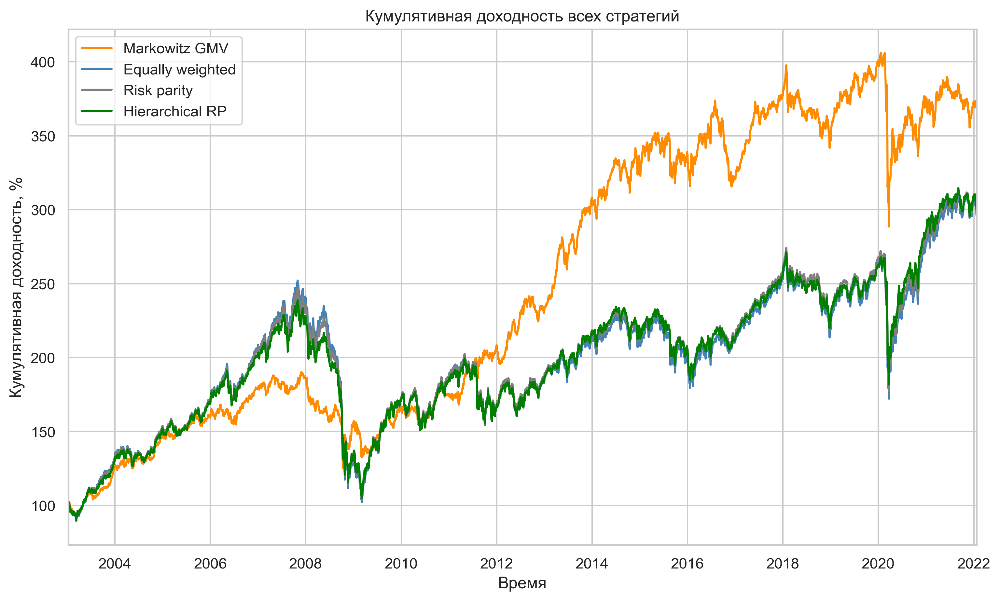

In [46]:
mv_cumrets = (Markowitz.strategy_returns + 1).cumprod() * 100
rp_cumrets = (RiskParity.strategy_returns + 1).cumprod() * 100
hrp_cumrets = (HRP.strategy_returns + 1).cumprod() * 100

strategy_cumrets = pd.DataFrame({'Markowitz GMV': mv_cumrets,
                                 'Equally weighted': cumrets,
                                 'Risk parity': rp_cumrets,
                                 'Hierarchical RP': hrp_cumrets})

# зададим цвета
color_dict = dict(zip(strategy_cumrets.columns,
                      ['darkorange', 'steelblue', 'gray', 'green']))

strategy_cumrets.plot(title='Кумулятивная доходность всех стратегий',
                      figsize=(12, 7),
                      color=[color_dict[x] for x in color_dict.keys()],
                      ylabel='Кумулятивная доходность, %',
                      xlabel='Время');

Аналогичный алгоритм для отраслкевых данных повторяем, меняя в коде частоту ребалансировки (step) на 63 (квартальную) и 126 (полугодовую)

#### Прогоним стратегии при диверсификации по развитым странам при ежемесячной ребалансировке

In [47]:
# создадим экземпляр класса
EqualWeighted = BackTest(prices=dm_d)
# прогоним стратегию
EqualWeighted.run(strategy='equal', start=252, step=21)

In [48]:
EqualWeighted.get_performance(periods_in_year=252, rf=rf_d)

{'cumulative return': 1.4980846951107156,
 'annualized return': 0.05714498535759306,
 'annualized vol': 0.14585683709380207,
 'sharpe': 0.2504047397898852,
 'omega': 1.0489724602164188,
 'max drawdown': -0.6224101792690646,
 'turnover': 0,
 'cer': 0.03557744598470149,
 'sortino': 0.3029640601612196,
 'calmar': 0.060468774762142595,
 'alpha': None,
 'alpha_pvalue': None}

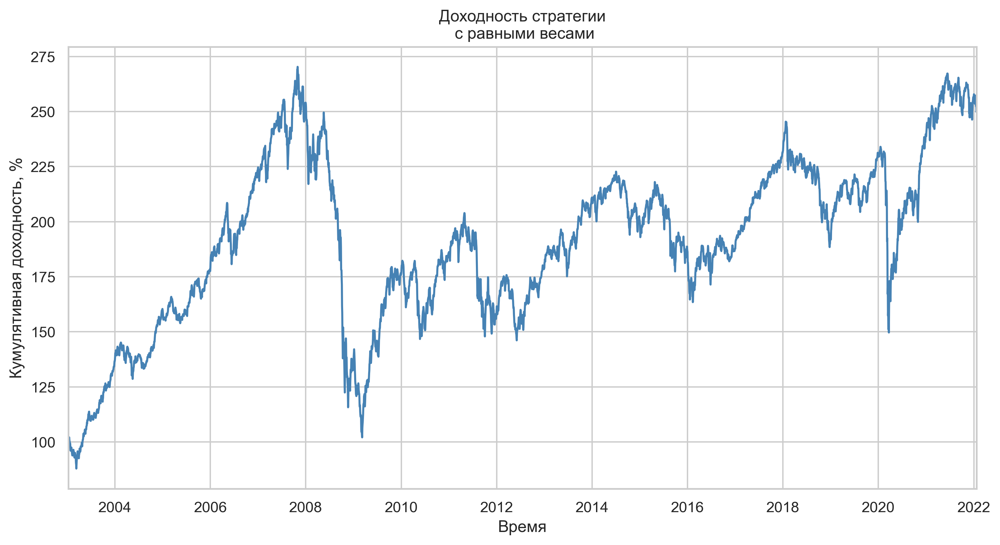

In [49]:
cumrets = (EqualWeighted.strategy_returns + 1).cumprod() * 100
cumrets.plot(title='Доходность стратегии\n c равными весами',
             figsize=(12, 6),
             color='steelblue',
             ylabel='Кумулятивная доходность, %',
             xlabel='Время');

In [50]:
# MV без коротких позиций
Markowitz = BackTest(prices=dm_d)
Markowitz.run(strategy='min-variance', start=252, step=21)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.4765838066964534,
 'annualized return': 0.05430712121138185,
 'annualized vol': 0.12838392436327223,
 'sharpe': 0.27036999496631864,
 'omega': 1.0524281531040889,
 'max drawdown': -0.5509316657103605,
 'turnover': 0.1279,
 'cer': 0.03402585097849517,
 'sortino': 0.314531484002642,
 'calmar': 0.0648103814275386,
 'alpha': None,
 'alpha_pvalue': None}

In [51]:
# MV с короткими позициями
Markowitz = BackTest(prices=dm_d)
Markowitz.run(strategy='min-variance', start=252, step=21, short=True)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.227238927548906,
 'annualized return': 0.048899725064361244,
 'annualized vol': 0.12840306681507618,
 'sharpe': 0.23886492978192939,
 'omega': 1.0444896205869827,
 'max drawdown': -0.5517036037743814,
 'turnover': 0.308,
 'cer': 0.0299584395924398,
 'sortino': 0.28393559272209745,
 'calmar': 0.057103390018496264,
 'alpha': None,
 'alpha_pvalue': None}

In [52]:
# Risk-Parity (RP)
RiskParity = BackTest(prices=dm_d)
RiskParity.run(strategy='risk-parity', start=252, step=21)
RiskParity.get_performance(rf=rf_d)

{'cumulative return': 1.4944962546026548,
 'annualized return': 0.05677435874645616,
 'annualized vol': 0.1438078557476787,
 'sharpe': 0.2537393001428791,
 'omega': 1.0495821982694566,
 'max drawdown': -0.6191790255302068,
 'turnover': 0.02,
 'cer': 0.03558382983029942,
 'sortino': 0.30393230252626496,
 'calmar': 0.060731180035031376,
 'alpha': None,
 'alpha_pvalue': None}

In [53]:
# HRP
HRP = BackTest(prices=dm_d)
HRP.run(strategy='hrp', start=252, step=21)
HRP.get_performance(rf=rf_d)

{'cumulative return': 1.67168266400293,
 'annualized return': 0.05922128381707549,
 'annualized vol': 0.13646560416814532,
 'sharpe': 0.28807406752241127,
 'omega': 1.0559868674295638,
 'max drawdown': -0.6080434179249485,
 'turnover': 0.1445,
 'cer': 0.03855829134438333,
 'sortino': 0.3419101389984151,
 'calmar': 0.06669744224238927,
 'alpha': None,
 'alpha_pvalue': None}

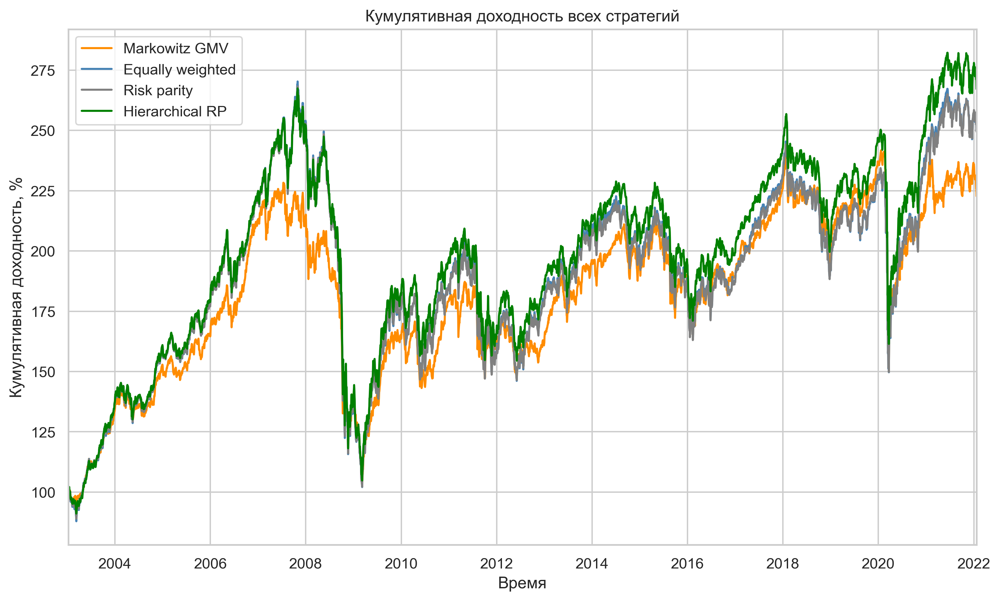

In [54]:
mv_cumrets = (Markowitz.strategy_returns + 1).cumprod() * 100
rp_cumrets = (RiskParity.strategy_returns + 1).cumprod() * 100
hrp_cumrets = (HRP.strategy_returns + 1).cumprod() * 100

strategy_cumrets = pd.DataFrame({'Markowitz GMV': mv_cumrets,
                                 'Equally weighted': cumrets,
                                 'Risk parity': rp_cumrets,
                                 'Hierarchical RP': hrp_cumrets})

# зададим цвета
color_dict = dict(zip(strategy_cumrets.columns,
                      ['darkorange', 'steelblue', 'gray', 'green']))

strategy_cumrets.plot(title='Кумулятивная доходность всех стратегий',
                      figsize=(12, 7),
                      color=[color_dict[x] for x in color_dict.keys()],
                      ylabel='Кумулятивная доходность, %',
                      xlabel='Время');

Аналогичный алгоритм для данных по развитым странам повторяем, меняя в коде частоту ребалансировки (step) на 63 (квартальную) и 126 (полугодовую)

#### Прогоним стратегии при диверсификации по развивающимся странам при ежемесячной ребалансировке

In [55]:
# создадим экземпляр класса
EqualWeighted = BackTest(prices=em_d)
# прогоним стратегию
EqualWeighted.run(strategy='equal', start=252, step=21)

In [56]:
EqualWeighted.get_performance(periods_in_year=252, rf=rf_d)

{'cumulative return': 2.7921762919814204,
 'annualized return': 0.07901154446750147,
 'annualized vol': 0.15050377210795368,
 'sharpe': 0.4048230343629914,
 'omega': 1.0743802376070346,
 'max drawdown': -0.6579609455591882,
 'turnover': 0,
 'cer': 0.05997485934272266,
 'sortino': 0.5021465558641407,
 'calmar': 0.0962702095621234,
 'alpha': None,
 'alpha_pvalue': None}

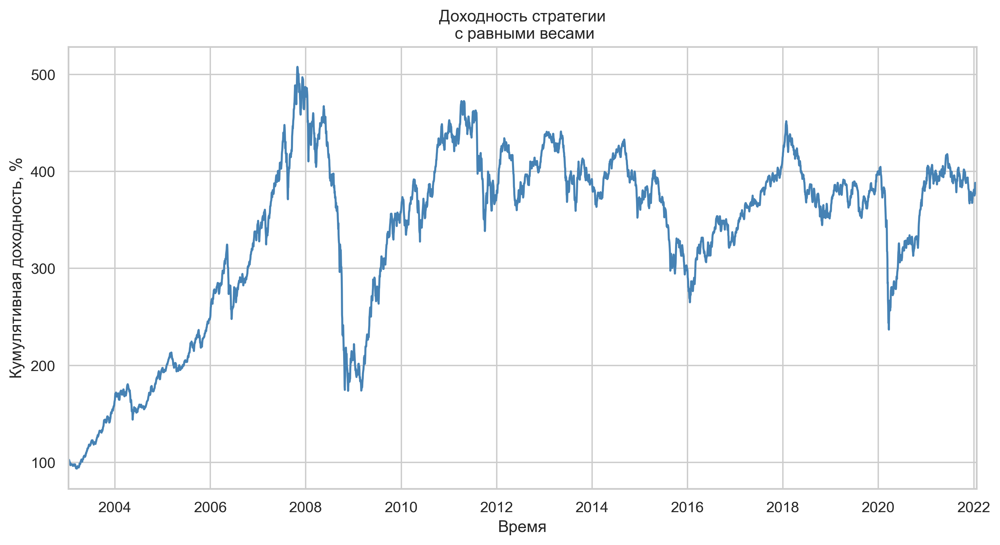

In [57]:
cumrets = (EqualWeighted.strategy_returns + 1).cumprod() * 100
cumrets.plot(title='Доходность стратегии\n c равными весами',
             figsize=(12, 6),
             color='steelblue',
             ylabel='Кумулятивная доходность, %',
             xlabel='Время');

In [58]:
# MV без коротких позиций
Markowitz = BackTest(prices=em_d)
Markowitz.run(strategy='min-variance', start=252, step=21)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.8498380069593656,
 'annualized return': 0.05976074430779935,
 'annualized vol': 0.1148704756193426,
 'sharpe': 0.34622472412451827,
 'omega': 1.0644843907281414,
 'max drawdown': -0.5824899861565606,
 'turnover': 0.1126,
 'cer': 0.03912263912295953,
 'sortino': 0.42977157670754923,
 'calmar': 0.06998725200752186,
 'alpha': None,
 'alpha_pvalue': None}

In [59]:
# MV с короткими позициями
Markowitz = BackTest(prices=em_d)
Markowitz.run(strategy='min-variance', start=252, step=21, short=True)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.4317595054156498,
 'annualized return': 0.0516689906801429,
 'annualized vol': 0.11452048123656486,
 'sharpe': 0.27113884018800055,
 'omega': 1.050964086848105,
 'max drawdown': -0.5959956134720301,
 'turnover': 0.1719,
 'cer': 0.030343447952052596,
 'sortino': 0.33961510795037747,
 'calmar': 0.053128693908373395,
 'alpha': None,
 'alpha_pvalue': None}

In [60]:
# Risk-Parity (RP)
RiskParity = BackTest(prices=em_d)
RiskParity.run(strategy='risk-parity', start=252, step=21)
RiskParity.get_performance(rf=rf_d)

{'cumulative return': 2.690366235160853,
 'annualized return': 0.07615264128557198,
 'annualized vol': 0.14038346335771706,
 'sharpe': 0.41034362280750675,
 'omega': 1.0759977451294576,
 'max drawdown': -0.6438075842952098,
 'turnover': 0.0258,
 'cer': 0.05679437729605501,
 'sortino': 0.5046821172199223,
 'calmar': 0.09283144721909989,
 'alpha': None,
 'alpha_pvalue': None}

In [61]:
# HRP
HRP = BackTest(prices=em_d)
HRP.run(strategy='hrp', start=252, step=21)
HRP.get_performance(rf=rf_d)

{'cumulative return': 2.454552831087735,
 'annualized return': 0.07138642039304208,
 'annualized vol': 0.1299645175855707,
 'sharpe': 0.400006982208537,
 'omega': 1.0748621034689314,
 'max drawdown': -0.6333451694231078,
 'turnover': 0.1465,
 'cer': 0.05126643570837831,
 'sortino': 0.4890313909584867,
 'calmar': 0.08483962215793416,
 'alpha': None,
 'alpha_pvalue': None}

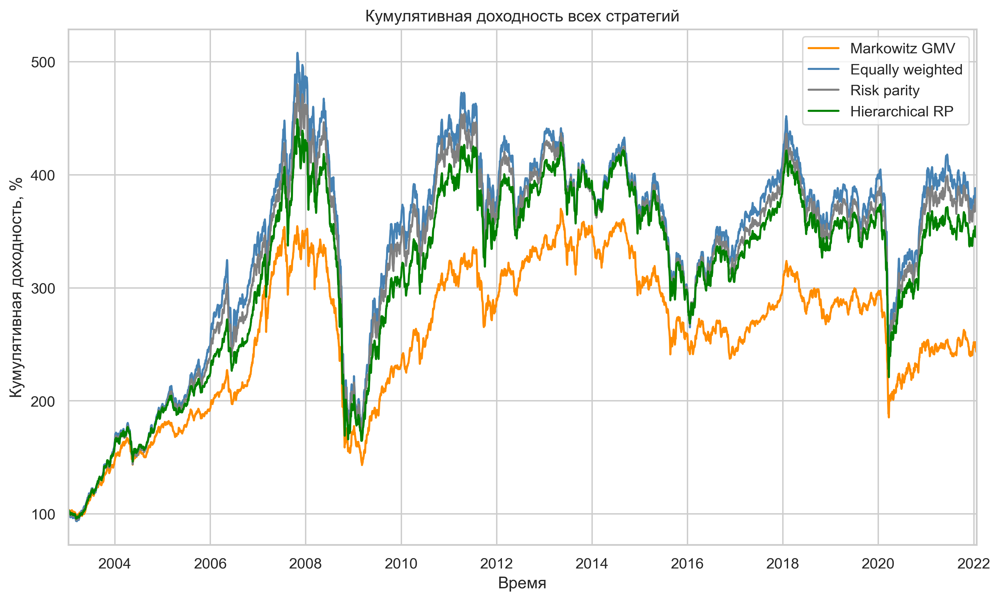

In [62]:
mv_cumrets = (Markowitz.strategy_returns + 1).cumprod() * 100
rp_cumrets = (RiskParity.strategy_returns + 1).cumprod() * 100
hrp_cumrets = (HRP.strategy_returns + 1).cumprod() * 100

strategy_cumrets = pd.DataFrame({'Markowitz GMV': mv_cumrets,
                                 'Equally weighted': cumrets,
                                 'Risk parity': rp_cumrets,
                                 'Hierarchical RP': hrp_cumrets})

# зададим цвета
color_dict = dict(zip(strategy_cumrets.columns,
                      ['darkorange', 'steelblue', 'gray', 'green']))

strategy_cumrets.plot(title='Кумулятивная доходность всех стратегий',
                      figsize=(12, 7),
                      color=[color_dict[x] for x in color_dict.keys()],
                      ylabel='Кумулятивная доходность, %',
                      xlabel='Время');

Аналогичный алгоритм для данных по развивающимся странам повторяем, меняя в коде частоту ребалансировки (step) на 63 (квартальную) и 126 (полугодовую)

#### Прогоним стратегии при диверсификации по совместной выборке развитых и развивающихся стран при ежемесячной ребалансировке

In [63]:
# создадим экземпляр класса
EqualWeighted = BackTest(prices=dm_em_d)
# прогоним стратегию
EqualWeighted.run(strategy='equal', start=252, step=21)

In [64]:
EqualWeighted.get_performance(periods_in_year=252, rf=rf_d)

{'cumulative return': 2.153079246199115,
 'annualized return': 0.06807826491254709,
 'annualized vol': 0.13973322487412237,
 'sharpe': 0.34851254267328335,
 'omega': 1.066351315634164,
 'max drawdown': -0.634387106819803,
 'turnover': 0,
 'cer': 0.04793231661966441,
 'sortino': 0.4201185398147035,
 'calmar': 0.07946392717597435,
 'alpha': None,
 'alpha_pvalue': None}

In [65]:
# MV без коротких позиций
Markowitz = BackTest(prices=dm_em_d)
Markowitz.run(strategy='min-variance', start=252, step=21)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.5553163174171103,
 'annualized return': 0.05338014277209684,
 'annualized vol': 0.10725245631866238,
 'sharpe': 0.3107112126992338,
 'omega': 1.059861322634882,
 'max drawdown': -0.5303012905134243,
 'turnover': 0.1564,
 'cer': 0.03282789364920902,
 'sortino': 0.36964619308922525,
 'calmar': 0.06435832316396291,
 'alpha': None,
 'alpha_pvalue': None}

In [66]:
# MV с короткими позициями
Markowitz = BackTest(prices=dm_em_d)
Markowitz.run(strategy='min-variance', start=252, step=21, short=True)
Markowitz.get_performance(rf=rf_d)

{'cumulative return': 1.0187323654276348,
 'annualized return': 0.04085234354459953,
 'annualized vol': 0.1018616116753589,
 'sharpe': 0.20451165239135807,
 'omega': 1.0387639598946041,
 'max drawdown': -0.5878117060334673,
 'turnover': 0.415,
 'cer': 0.020319402324357617,
 'sortino': 0.2440769900246526,
 'calmar': 0.03607002226592696,
 'alpha': None,
 'alpha_pvalue': None}

In [67]:
# Risk-Parity (RP)
RiskParity = BackTest(prices=dm_em_d)
RiskParity.run(strategy='risk-parity', start=252, step=21)
RiskParity.get_performance(rf=rf_d)

{'cumulative return': 2.0382268660536504,
 'annualized return': 0.06536148837319986,
 'annualized vol': 0.13365812643322558,
 'sharpe': 0.3431175477574904,
 'omega': 1.065805476589352,
 'max drawdown': -0.624357476753342,
 'turnover': 0.0245,
 'cer': 0.045171479034385766,
 'sortino': 0.41001202926125574,
 'calmar': 0.0759238200066021,
 'alpha': None,
 'alpha_pvalue': None}

In [68]:
# HRP
HRP = BackTest(prices=dm_em_d)
HRP.run(strategy='hrp', start=252, step=21)
HRP.get_performance(rf=rf_d)

{'cumulative return': 2.1436872734225245,
 'annualized return': 0.06581674475815727,
 'annualized vol': 0.12379104945792904,
 'sharpe': 0.3713345732185139,
 'omega': 1.0716937603444199,
 'max drawdown': -0.6003630898538846,
 'turnover': 0.1774,
 'cer': 0.04540957019225663,
 'sortino': 0.44152122127014937,
 'calmar': 0.07908620143549652,
 'alpha': None,
 'alpha_pvalue': None}

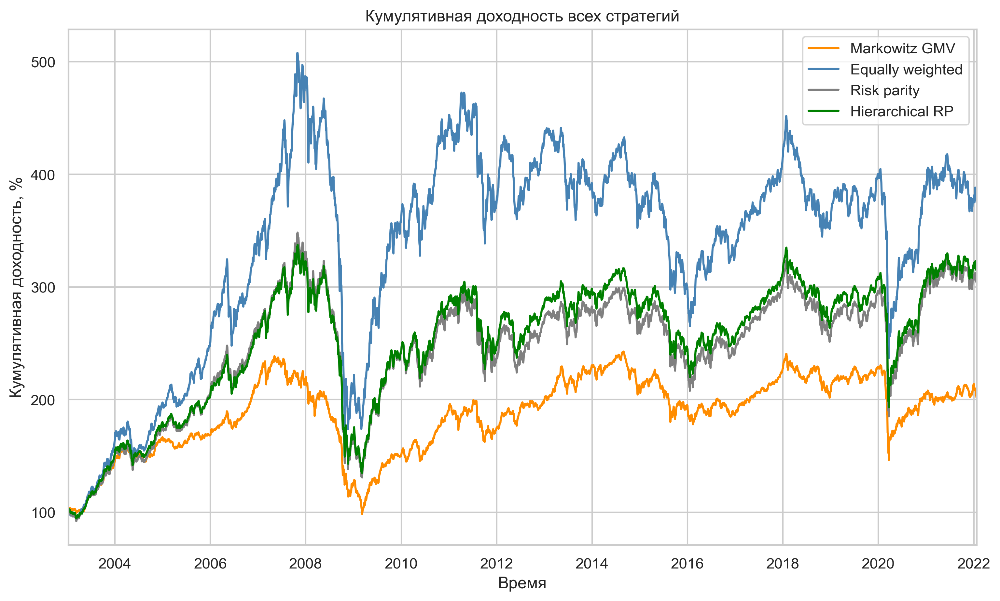

In [69]:
mv_cumrets = (Markowitz.strategy_returns + 1).cumprod() * 100
rp_cumrets = (RiskParity.strategy_returns + 1).cumprod() * 100
hrp_cumrets = (HRP.strategy_returns + 1).cumprod() * 100

strategy_cumrets = pd.DataFrame({'Markowitz GMV': mv_cumrets,
                                 'Equally weighted': cumrets,
                                 'Risk parity': rp_cumrets,
                                 'Hierarchical RP': hrp_cumrets})

# зададим цвета
color_dict = dict(zip(strategy_cumrets.columns,
                      ['darkorange', 'steelblue', 'gray', 'green']))

strategy_cumrets.plot(title='Кумулятивная доходность всех стратегий',
                      figsize=(12, 7),
                      color=[color_dict[x] for x in color_dict.keys()],
                      ylabel='Кумулятивная доходность, %',
                      xlabel='Время');

Аналогичный алгоритм для данных по совместной выборке развитых и развивающихся стран повторяем, меняя в коде частоту ребалансировки (step) на 63 (квартальную) и 126 (полугодовую)

## Часть 3. Тестирование множественных стратегий.

Попробуем протестировать сразу несколько стратегий с разными параметрами. Для этого предназначен класс GridBacktest, который также содержится в модуле backtesting.py. Импортируем класс:

In [70]:
from backtesting import GridBacktest

In [71]:
help(GridBacktest)

Help on class GridBacktest in module backtesting:

class GridBacktest(builtins.object)
 |  GridBacktest(prices: Union[pandas.core.series.Series, pandas.core.frame.DataFrame])
 |  
 |  Methods defined here:
 |  
 |  __init__(self, prices: Union[pandas.core.series.Series, pandas.core.frame.DataFrame])
 |      Parameters:
 |      ----------
 |      prices: pd.DataFrame
 |          Prices of assets to build asset allocation models for.
 |  
 |  backtest = inner(self, *args)
 |  
 |  parameter_grid(self, param_dict)
 |      Generates a list of dicts with parameter combinations
 |  
 |  performance_table(self, metric: str, columns: Union[str, list] = None, index: Union[str, list] = 'strategy', ndigits: int = 3)
 |      Returns dataframe with one performance metric calculated for
 |      all the strategies supplied. You can select, which strategy
 |      parameters to show in row indexes and which in columns.
 |      
 |      Parameters:
 |      -----------
 |      metric: str.
 |          Wh

In [72]:
# создадим объект, передав ему цены активов
grid = GridBacktest(prices=dm_d)

In [73]:
# получим данные с сайта Кеннета Френча по 5 факторам для развитых рынков
from factor_parser import FactorRequest
request = FactorRequest()
f = request.get_table("Fama/French Developed 5 Factors [Daily]")
f.head()

Parsing webpage https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html ...
Extracting links for tables with data...


,mkt_rf,smb,hml,rmw,cma,rf
date,,,,,,
1990-07-02,0.0069,-0.0008,-0.0033,0.0021,0.0000,0.0003
1990-07-03,0.0018,0.0007,-0.0015,0.0005,0.0004,0.0003
1990-07-04,0.0062,-0.0018,-0.0017,-0.0004,0.0001,0.0003
1990-07-05,-0.0074,0.0031,0.0014,-0.0013,0.0004,0.0003
1990-07-06,0.0020,-0.0015,0.0002,0.0018,-0.0003,0.0003


In [74]:
# отдельно загрузим momentum, так как его нет в 5 факторах
mom_request = FactorRequest()
m = mom_request.get_table("Developed Momentum Factor (Mom) [Daily]")
m.head()

Parsing webpage https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html ...
Extracting links for tables with data...


,wml
date,
1990-11-01,0.0084
1990-11-02,-0.0028
1990-11-05,-0.0034
1990-11-06,-0.0007
1990-11-07,0.0035


In [75]:
# объединим оба датасета в один
f = pd.merge(left=f, right=m, left_index=True, right_index=True, how='inner')
f.drop(columns='rf', inplace=True)
# объединим доходности стратегии и доходности факторов
s = Markowitz.strategy_returns
s.name = 'markowitz'
r = pd.merge(left=pd.DataFrame(Markowitz.strategy_returns),
             right=f,
             left_index=True,
             right_index=True,
             how='inner')

Соберем воедино разные параметры для стратегий и одновременно прогоним различные стратегии.

In [76]:
# Создадим набор стратегий и параметров, с которыми мы хотим тестировать стратегии
# Имена стратегий взяты из BackTest.run(), параметры стратегий - из BackTest.run() и Backtest.get_performance()
params = {'strategy':
          # все стратегии, которые сейчас реализованы в BackTest
            ['equal', 'hrp', 'risk-parity', 'min-variance'],
        'start': [63, 126, 252],
        'step': [21, 63, 126],
        'window': [63, 126],
        'short': [True, False],
        'factor_returns': r.drop(columns=['markowitz'])
         }

In [77]:
# Изготовим из этих параметров и стратегий словарик, то есть изготовим все комбинации параметров, которые мы задали выше
param_dict = grid.parameter_grid(params)
param_dict

[{'strategy': 'equal',
  'start': 63,
  'step': 21,
  'window': 63,
  'short': True,
  'factor_returns':             mkt_rf     smb     hml     rmw     cma     wml
  date                                                      
  2003-01-09  0.0111 -0.0056 -0.0044 -0.0050  0.0030 -0.0092
  2003-01-10  0.0036  0.0004  0.0008 -0.0053  0.0009 -0.0057
  2003-01-13 -0.0005  0.0014  0.0016 -0.0033 -0.0012 -0.0035
  2003-01-14  0.0061 -0.0009  0.0022 -0.0047  0.0003 -0.0066
  2003-01-15 -0.0085  0.0089  0.0058  0.0010 -0.0007  0.0051
  ...            ...     ...     ...     ...     ...     ...
  2022-01-17  0.0015 -0.0013  0.0013 -0.0005  0.0006  0.0013
  2022-01-18 -0.0172 -0.0003  0.0063  0.0029  0.0067 -0.0016
  2022-01-19 -0.0079 -0.0012 -0.0016  0.0029  0.0002 -0.0025
  2022-01-20 -0.0059  0.0022 -0.0053  0.0004 -0.0022 -0.0012
  2022-01-21 -0.0177  0.0034  0.0076  0.0045  0.0076 -0.0006
  
  [4967 rows x 6 columns]},
 {'strategy': 'equal',
  'start': 63,
  'step': 21,
  'window': 63,
  'sh

In [78]:
%%time
# запустим тестирование стратегий
grid.backtest(param_dict)

Parameter window not found in parameters of Backtest.run(), Backtest.get_performance() or model from models.py. Removing it.
For the strategy 'equal' shorts are prohibited. Removing 'short' parameter from this strategy parameters.
Parameter window not found in parameters of Backtest.run(), Backtest.get_performance() or model from models.py. Removing it.
For the strategy 'equal' shorts are prohibited. Removing 'short' parameter from this strategy parameters.
Parameter window not found in parameters of Backtest.run(), Backtest.get_performance() or model from models.py. Removing it.
For the strategy 'equal' shorts are prohibited. Removing 'short' parameter from this strategy parameters.
Parameter window not found in parameters of Backtest.run(), Backtest.get_performance() or model from models.py. Removing it.
For the strategy 'equal' shorts are prohibited. Removing 'short' parameter from this strategy parameters.
Parameter window not found in parameters of Backtest.run(), Backtest.get_per

Теперь можно посмотреть на метрики эффективности разных стратегий - они хранятся в атрибуте backtest_results нашего экземпляра класса:

In [79]:
pd.DataFrame(grid.backtest_results).T

,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
strategy,equal,equal,equal,equal,equal,equal,equal,equal,equal,hrp,...,min-variance,min-variance,min-variance,min-variance,min-variance,min-variance,min-variance,min-variance,min-variance,min-variance
start,63,63,63,126,126,126,252,252,252,63,...,126,126,126,126,252,252,252,252,252,252
step,21,63,126,21,63,126,21,63,126,21,...,63,63,126,126,21,21,63,63,126,126
factor_returns,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...,mkt_rf smb hml rmw ...
cumulative return,1.102078,1.102078,1.102078,1.349208,1.349208,1.349208,1.498085,1.498085,1.498085,1.318819,...,1.418273,1.510875,1.333501,1.468912,1.227239,1.476584,1.380748,1.590883,1.479762,1.686552
annualized return,0.047257,0.047257,0.047257,0.053191,0.053191,0.053191,0.057145,0.057145,0.057145,0.050424,...,0.052647,0.054141,0.050491,0.05316,0.0489,0.054307,0.052504,0.056791,0.054717,0.058571
annualized vol,0.147587,0.147587,0.147587,0.147473,0.147473,0.147473,0.145857,0.145857,0.145857,0.136125,...,0.133422,0.13063,0.130748,0.129614,0.128403,0.128384,0.13011,0.129889,0.131285,0.129467
sharpe,0.186024,0.186024,0.186024,0.226401,0.226401,0.226401,0.256021,0.256021,0.256021,0.224951,...,0.246173,0.26287,0.234716,0.257357,0.226607,0.26876,0.251335,0.284768,0.265944,0.299443
omega,1.035186,1.035186,1.035186,1.043036,1.043036,1.043036,1.048972,1.048972,1.048972,1.042993,...,1.049249,1.051316,1.045419,1.049537,1.04449,1.052428,1.049433,1.055725,1.051895,1.05816
max drawdown,-0.62241,-0.62241,-0.62241,-0.62241,-0.62241,-0.62241,-0.62241,-0.62241,-0.62241,-0.605316,...,-0.541915,-0.5499,-0.537101,-0.556403,-0.551704,-0.550932,-0.533277,-0.54702,-0.521363,-0.549144


Но даже с учетом того, что мы преобразовали `grid.backtest_results` в `Pandas DataFrame`, смотрится это как-то не слишком аккуратно. На этот случай в `grid` реализован метод `performance_table`, который позволяет аккуратно сравнить все модели со всеми вариациями параметров по одной (но любой) метрике эффективности. Допустим, мы хотим посмотреть на Sharpe ratio.


In [80]:
sharpe = grid.performance_table(metric='sharpe')
sharpe

sharpe                                
strategy          equal    hrp min-variance risk-parity
step start short                                       
21   63    False  0.186  0.225        0.246       0.195
           True      --     --        0.205          --
     126   False  0.226  0.239        0.241       0.228
           True      --     --        0.227          --
     252   False  0.256  0.289        0.269       0.257
           True      --     --        0.227          --
63   63    False  0.186  0.231        0.232        0.19
           True      --     --        0.257          --
     126   False  0.226  0.257        0.263        0.23
           True      --     --        0.246          --
     252   False  0.256   0.28        0.285       0.258
           True      --     --        0.251          --
126  63    False  0.186  0.212        0.192       0.188
           True      --     --        0.183          --
     126   False  0.226  0.238        0.257       0.231
           True      --     --        0.235          --
     252   False  0.256  0.273        0.299       0.257
           True      --     --        0.266          --

In [81]:
ann_return = grid.performance_table(metric='annualized return')
ann_return

annualized return                                
strategy                     equal    hrp min-variance risk-parity
step start short                                                  
21   63    False             0.047   0.05        0.051       0.048
           True                 --     --        0.048          --
     126   False             0.053  0.053        0.051       0.053
           True                 --     --        0.050          --
     252   False             0.057  0.059        0.054       0.057
           True                 --     --        0.049          --
63   63    False             0.047  0.051        0.050       0.047
           True                 --     --        0.056          --
     126   False             0.053  0.055        0.054       0.053
           True                 --     --        0.053          --
     252   False             0.057  0.058        0.057       0.057
           True                 --     --        0.053          --
126  63    False             0.047  0.049        0.046       0.047
           True                 --     --        0.046          --
     126   False             0.053  0.053        0.053       0.053
           True                 --     --        0.050          --
     252   False             0.057  0.058        0.059       0.057
           True                 --     --        0.055          --

In [82]:
alphas = grid.performance_table(metric='alpha',
                               ndigits=7)
alphas
#из многофакторной модели Фамы-Френча

alpha                                   
strategy             equal       hrp min-variance risk-parity
step start short                                             
21   63    False -0.000077 -0.000062    -0.000060   -0.000075
           True         --        --    -0.000110          --
     126   False -0.000077 -0.000077    -0.000091    -0.00008
           True         --        --    -0.000118          --
     252   False -0.000077  -0.00007    -0.000090    -0.00008
           True         --        --    -0.000122          --
63   63    False -0.000077 -0.000061    -0.000071   -0.000079
           True         --        --    -0.000081          --
     126   False -0.000077 -0.000067    -0.000084    -0.00008
           True         --        --    -0.000110          --
     252   False -0.000077 -0.000073    -0.000084    -0.00008
           True         --        --    -0.000114          --
126  63    False -0.000077 -0.000073    -0.000102   -0.000081
           True         --        --    -0.000123          --
     126   False -0.000077 -0.000079    -0.000080   -0.000079
           True         --        --    -0.000101          --
     252   False -0.000077 -0.000076    -0.000070    -0.00008
           True         --        --    -0.000103          --

In [83]:
sortino = grid.performance_table(metric='sortino',
                               ndigits=7)
sortino

sortino                                   
strategy             equal       hrp min-variance risk-parity
step start short                                             
21   63    False  0.226352  0.268382     0.289377    0.234394
           True         --        --     0.235455          --
     126   False  0.274961  0.287222     0.280899    0.273919
           True         --        --     0.264336          --
     252   False  0.309078  0.341929     0.311936    0.307355
           True         --        --     0.268550          --
63   63    False  0.226352  0.277047     0.274437    0.228352
           True         --        --     0.296501          --
     126   False  0.274961  0.308152     0.307585    0.276653
           True         --        --     0.286672          --
     252   False  0.309078  0.331855     0.330756    0.308262
           True         --        --     0.298002          --
126  63    False  0.226352  0.252839     0.223427    0.226379
           True         --        --     0.206210          --
     126   False  0.274961  0.285357     0.307719    0.277244
           True         --        --     0.287211          --
     252   False  0.309078  0.324003     0.351223    0.307356
           True         --        --     0.319835          --

In [84]:
calmar = grid.performance_table(metric='calmar',
                               ndigits=7)
calmar

calmar                                   
strategy             equal       hrp min-variance risk-parity
step start short                                             
21   63    False  0.044719  0.051367     0.059193    0.045891
           True         --        --     0.052020          --
     126   False  0.054545  0.054191     0.057732    0.054195
           True         --        --     0.054192          --
     252   False  0.061126  0.066118     0.063718    0.060824
           True         --        --     0.053512          --
63   63    False  0.044719  0.053068     0.055973     0.04489
           True         --        --     0.071313          --
     126   False  0.054545  0.059642     0.063526    0.054841
           True         --        --     0.061611          --
     252   False  0.061126  0.065201     0.068879    0.061131
           True         --        --     0.062331          --
126  63    False  0.044719  0.048534     0.046146    0.044812
           True         --        --     0.046492          --
     126   False  0.054545  0.055658     0.060959    0.055024
           True         --        --     0.058020          --
     252   False  0.061126  0.063902     0.071978    0.060974
           True         --        --     0.068146          --

Посмотрим на структуру какого-нибудь портфеля с течением времени, как там все распределено по активам. Выберем портфель с максимальным коэффициентом Шарпа и посмотрим на структуру в нем на конец каждого года.

In [85]:
Markowitz = BackTest(prices=dm_d)
Markowitz.run(strategy='min-variance', start=252, step=63, short=True)

In [86]:
df = Markowitz.weights_df
plot_df = \
df.iloc[df.reset_index().groupby(df.index.to_period('Y'))['date'].idxmax()]
plot_df.head()

,us,japan,hong_kong,uk,canada,france,germany,switz,australia,spain
date,,,,,,,,,,
2003-12-31,0.28004,-0.00975,0.15845,0.05370,0.26707,-0.25954,-0.18193,0.10921,0.26462,0.31813
2004-12-31,0.54965,-0.02095,0.12914,0.13345,-0.03423,0.02856,-0.25370,0.15981,0.18631,0.12197
2005-12-30,0.38280,0.07425,0.24457,0.09580,-0.03665,-0.19212,-0.01224,0.18436,0.07678,0.18246
2006-12-29,0.69565,-0.07208,0.24753,-0.00114,-0.04576,-0.22796,-0.24225,0.13951,0.17026,0.33625
2007-12-31,0.58469,0.31936,-0.05840,-0.16758,-0.09010,-0.06775,0.05382,0.25854,0.03342,0.13402


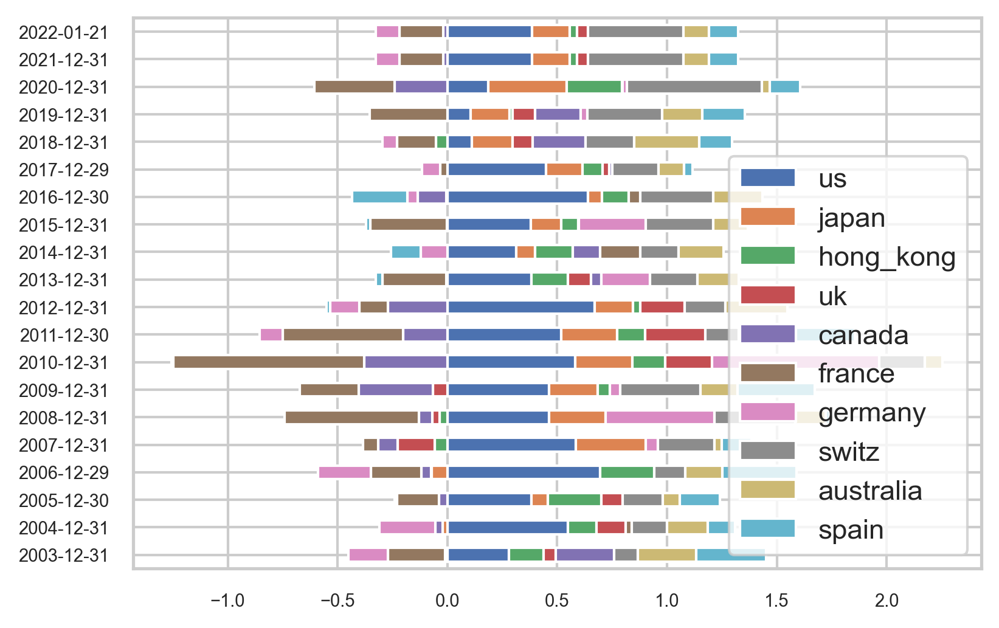

In [87]:
fig, ax = plt.subplots()
plot_df.index = plot_df.index.date
plot_df.plot(ax=ax, kind='barh', stacked=True, mark_right = True,
            fontsize=7);

## Часть 4. Многофакторный анализ.

Регрессия для факторов:

$$
r_t = \alpha + \beta_1 \times MKT_t + \beta_2 \times SMB_t + ... + \varepsilon_t
$$

Напишем код для факторного анализа (посмотрим, какие стратегии ставили на какие факторы) при отраслевой диверсификации.

In [88]:
Equal = BackTest(prices=sector_d)
Equal.run(strategy='equal', start=252, step=126)

Markowitz = BackTest(prices=sector_d)
Markowitz.run(strategy='min-variance', start=252, step=63, short=True)

RiskParity = BackTest(prices=sector_d)
RiskParity.run(strategy='risk-parity', start=252, step=21)

HRP = BackTest(prices=sector_d)
HRP.run(strategy='hrp', start=252, step=63)

In [89]:
markowitz =  Markowitz.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)
equal =  Equal.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)
hrp =  HRP.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)
rp =  RiskParity.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)

In [90]:
merged = pd.concat([pd.DataFrame(markowitz).T,
           pd.DataFrame(equal).T, 
           pd.DataFrame(hrp).T, 
           pd.DataFrame(rp).T],
           axis=1)

merged.columns = ['markowitz-coefs', 'markowitz-pvals', 
                  'equal-coefs', 'equal-pvals', 
                  'hrp-coefs', 'hrp-pvals', 
                  'risk-parity-coefs', 'risk-parity-pvals']
merged.round(4)

,markowitz-coefs,markowitz-pvals,equal-coefs,equal-pvals,hrp-coefs,hrp-pvals,risk-parity-coefs,risk-parity-pvals
alpha,0.0000,0.7214,-0.0001,0.0009,-0.0001,0.0105,-0.0001,0.0019
mkt_rf,0.5025,0.0000,0.9326,0.0000,0.8568,0.0000,0.8967,0.0000
smb,-0.0528,0.0088,0.0914,0.0000,0.0609,0.0000,0.0824,0.0000
hml,0.1052,0.0000,0.0773,0.0000,0.0467,0.0000,0.0742,0.0000
rmw,0.5278,0.0000,0.1639,0.0000,0.1679,0.0000,0.1800,0.0000
wml,0.1290,0.0000,-0.0052,0.3521,0.0089,0.1135,0.0025,0.6437


Можно сделать грубое обобщение, что Марковиц - это оптимизация Шарпа портфеля.

С фактором CMA:

In [91]:
markowitz =  Markowitz.factor_regression(factor_returns=r.drop(columns=['markowitz']),
                                  alpha_only = False)
equal =  Equal.factor_regression(factor_returns=r.drop(columns=['markowitz']),
                                  alpha_only = False)
hrp =  HRP.factor_regression(factor_returns=r.drop(columns=['markowitz']),
                                  alpha_only = False)
rp =  RiskParity.factor_regression(factor_returns=r.drop(columns=['markowitz']),
                                  alpha_only = False)

In [92]:
merged = pd.concat([pd.DataFrame(markowitz).T,
           pd.DataFrame(equal).T, 
           pd.DataFrame(hrp).T, 
           pd.DataFrame(rp).T],
           axis=1)

merged.columns = ['markowitz-coefs', 'markowitz-pvals', 
                  'equal-coefs', 'equal-pvals', 
                  'hrp-coefs', 'hrp-pvals', 
                  'risk-parity-coefs', 'risk-parity-pvals']
merged.round(4)

,markowitz-coefs,markowitz-pvals,equal-coefs,equal-pvals,hrp-coefs,hrp-pvals,risk-parity-coefs,risk-parity-pvals
alpha,-0.0000,0.6686,-0.0001,0.0021,-0.0001,0.0074,-0.0001,0.0025
mkt_rf,0.5894,0.0000,0.9189,0.0000,0.8628,0.0000,0.8925,0.0000
smb,-0.0107,0.5760,0.0847,0.0000,0.0638,0.0000,0.0803,0.0000
hml,-0.2199,0.0000,0.1288,0.0000,0.0243,0.0334,0.0900,0.0000
rmw,0.5874,0.0000,0.1544,0.0000,0.1720,0.0000,0.1771,0.0000
cma,0.7800,0.0000,-0.1235,0.0000,0.0539,0.0007,-0.0380,0.0146
wml,0.0778,0.0000,0.0029,0.6085,0.0054,0.3482,0.0050,0.3667


Диверсификация страновая:

In [93]:
Equal = BackTest(prices=dm_d)
Equal.run(strategy='equal', start=252, step=126)

Markowitz = BackTest(prices=dm_d)
Markowitz.run(strategy='min-variance', start=252, step=63, short=True)

RiskParity = BackTest(prices=dm_d)
RiskParity.run(strategy='risk-parity', start=252, step=21)

HRP = BackTest(prices=dm_d)
HRP.run(strategy='hrp', start=252, step=63)

In [94]:
markowitz =  Markowitz.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)
equal =  Equal.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)
hrp =  HRP.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)
rp =  RiskParity.factor_regression(factor_returns=r.drop(columns=['markowitz', 'cma']),
                                  alpha_only = False)

In [95]:
merged = pd.concat([pd.DataFrame(markowitz).T,
           pd.DataFrame(equal).T, 
           pd.DataFrame(hrp).T, 
           pd.DataFrame(rp).T],
           axis=1)

merged.columns = ['markowitz-coefs', 'markowitz-pvals', 
                  'equal-coefs', 'equal-pvals', 
                  'hrp-coefs', 'hrp-pvals', 
                  'risk-parity-coefs', 'risk-parity-pvals']
merged.round(4)

,markowitz-coefs,markowitz-pvals,equal-coefs,equal-pvals,hrp-coefs,hrp-pvals,risk-parity-coefs,risk-parity-pvals
alpha,-0.0001,0.1087,-0.0001,0.1320,-0.0001,0.1014,-0.0001,0.1033
mkt_rf,0.7482,0.0000,0.8456,0.0000,0.8297,0.0000,0.8428,0.0000
smb,0.3077,0.0000,0.1371,0.0000,0.2094,0.0000,0.1261,0.0000
hml,0.0501,0.0136,0.1602,0.0000,0.1143,0.0000,0.1557,0.0000
rmw,0.2160,0.0000,0.0721,0.0092,0.1177,0.0000,0.0865,0.0010
wml,0.0684,0.0000,-0.0182,0.0996,-0.0161,0.1041,-0.0128,0.2242
